# Exploratory Data Analysis (EDA)

Explanatory Data Analyis (EDA) adalah suatu pendekatan dalam analisis data, EDA bertujuan untuk mengetahui serta menjelaskan karakteristik dari dataset melalui visualisasi data dan juga statistik deskriptif. EDA juga digunakan untuk mengidentifikasi pola atau hubungan dalam data, menenukan anomali serta memperoleh wawasan yang berguna untuk mengambil keputusan.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from operator import attrgetter
import json
import plotly.graph_objs as go
import plotly.express as px

%matplotlib inline

In [2]:
df = pd.read_csv('1. merge.csv')

In [3]:
# Check Order Status
df.order_status.value_counts()

delivered    108608
canceled          7
Name: order_status, dtype: int64

In [4]:
# Order status delivery
df = df[~(df.order_status == 'canceled')]

Kita akan melakukan segmentasi pelanggan berdasarkan perilaku pembelian mereka yang dinyatakan melalui status pesanan "delivered". Namun perlu diingat bahwa jumlah pesanan yang dibatalkan atau memiliki status "canceled" hanya sedikit, yakni hanya terdapat 7 baris data, sehingga akan diabaikan dalam analisis segmentasi yang kita lakukan.

## Descriptive Analysis

### Monthly Sales and Users Time Series

In [5]:
# Convert Data type
df['order_approved_at'] = pd.to_datetime(df['order_approved_at'])

In [6]:
# Mengelompokkan data berdasarkan bulan
monthly_sales = df.groupby(df['order_approved_at'].dt.to_period('M')).sum()['payment_value']
monthly_user = df.groupby(df['order_approved_at'].dt.to_period('M')).count()['customer_unique_id']

# Mengubah objek pandas.Period menjadi string
monthly_sales.index = monthly_sales.index.strftime('%Y-%m')
monthly_user.index = monthly_user.index.strftime('%Y-%m')

# Melakukan serialisasi JSON
monthly_sales_json = json.dumps(monthly_sales.to_dict())
monthly_user_json = json.dumps(monthly_user.to_dict())

C:\Users\Fazas\AppData\Local\Temp\ipykernel_14296\2551014854.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  monthly_sales = df.groupby(df['order_approved_at'].dt.to_period('M')).sum()['payment_value']


In [7]:
# Membuat trace untuk monthly sales
trace_sales = go.Scatter(x=monthly_sales.index, y=monthly_sales.values, mode='lines+markers', name='Monthly Sales')

# Membuat trace untuk monthly users
trace_users = go.Scatter(x=monthly_user.index, y=monthly_user.values, mode='lines+markers', name='Monthly Users', yaxis='y2')

# Mengatur layout untuk grafik
layout = go.Layout(title='Monthly Sales and Users Time Series', xaxis=dict(title='Month'), yaxis=dict(title='Total Sales'),
                   yaxis2=dict(title='Total Users', overlaying='y', side='right'))

# Menggabungkan trace dan layout
fig = go.Figure(data=[trace_sales, trace_users], layout=layout)

# Menampilkan plot
fig.show()


Dari grafik diatas didapatkan informasi bahwa terdapat korelasi positif antara penjualan dan jumlah pengguna yang dapat dilihat dari kenaikan keduanya secara serentak pada bulan Agustus dan Oktober. Selain itu jika diperhatikan diantara bulan Oktober 2016 hingga Januari 2017 tidak terdapat record data sama sekali, hal ini tidak ada penjelasan yang jelas dari pihak perusahaan, sehingga kami memutuskan untuk fokus dari Januari 2017 hingga Agustus 2018.

In [8]:
# Fokus kita dari Jan 2017 - Aug 2018
df = df[df['order_approved_at'] >= '2017-01-01']

### Analysis by State

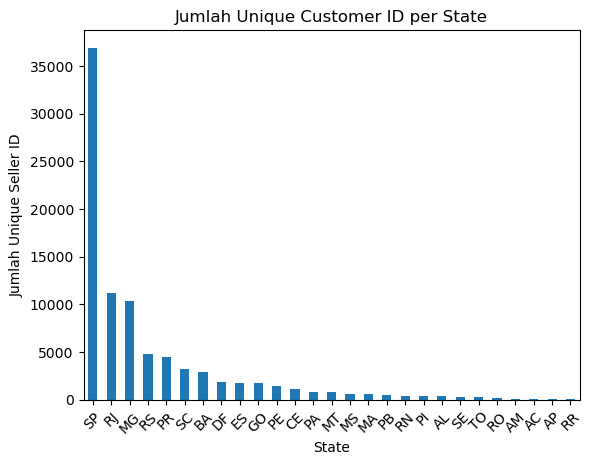

In [9]:
# Grupkan dataframe dan hitung jumlah unique seller_id berdasarkan seller_state
df.groupby('customer_state')['customer_unique_id'].nunique().sort_values(ascending=False).plot(kind='bar')

plt.title('Jumlah Unique Customer ID per State')
plt.xlabel('State')
plt.ylabel('Jumlah Unique Seller ID')
plt.xticks(rotation=45)
plt.show()

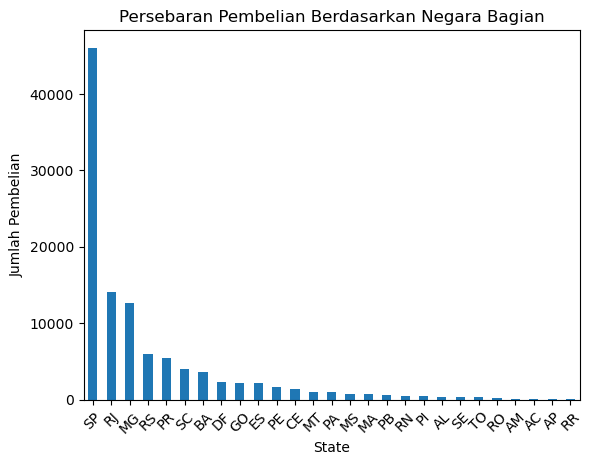

In [19]:
df['customer_state'].value_counts().sort_values(ascending=False).plot.bar(rot=45)
plt.title('Persebaran Pembelian Berdasarkan Negara Bagian')
plt.xlabel('State')
plt.ylabel('Jumlah Pembelian')
plt.xticks(rotation=45)
plt.show()

In [11]:
# Membuat plot histogram untuk melihat distribusi variabel numerik
fig = px.histogram(df, x='customer_state', nbins=25, color='Category')
fig.update_layout(title='Customer Distribution', width=800, height=400)
fig.update_xaxes(tickangle=45)
fig.show()

Dari grafik di atas terlihat bahwa negara bagian SP (Sao Paulo) memiliki jumlah customer paling tinggi dibandingkan negara bagian lain, diikuti oleh RJ (Rio de Janeiro) diurutan kedua, dan MG (Minas Gerais) diurutan ketiga sesuai dengan tabel unique customer diatas.

Maka berdasarkan data diatas terlihat bahwa pembeli atau pengguna Olist E-Commerce belum merata dan masih didominasi oleh negara-negara bagian yang besar seperti Sao Paulo dan kategori barang yang banyak dibeli adalah Furniture.

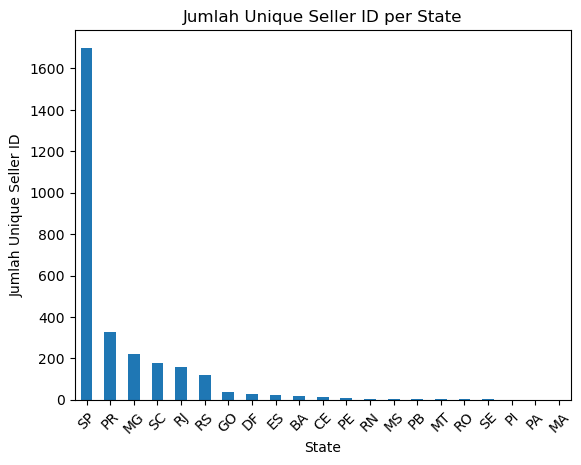

In [12]:
# Grupkan dataframe dan hitung jumlah unique seller_id berdasarkan seller_state
df.groupby('seller_state')['seller_id'].nunique().sort_values(ascending=False).plot(kind='bar')

plt.title('Jumlah Unique Seller ID per State')
plt.xlabel('State')
plt.ylabel('Jumlah Unique Seller ID')
plt.xticks(rotation=45)
plt.show()

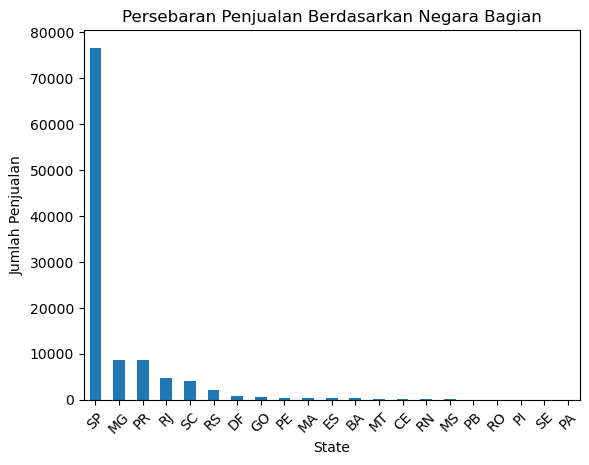

In [18]:
df['seller_state'].value_counts().sort_values(ascending=False).plot.bar(rot=45)
plt.title('Persebaran Penjualan Berdasarkan Negara Bagian')
plt.xlabel('State')
plt.ylabel('Jumlah Penjualan')
plt.xticks(rotation=45)
plt.show()

In [14]:
# Membuat plot histogram untuk melihat distribusi variabel numerik
fig = px.histogram(df, x='seller_state', nbins=25, color='Category')
fig.update_layout(title='Seller Distribution', width=800, height=400)
fig.update_xaxes(tickangle=45)
fig.show()

dari grafik diatas terlihat bahwa SP (Sao Paulo) merupakan negara bagian yang memiliki penjual paling banyak di Olist, diikuti oleh MG (Minas Gerais) diurutan kedua, dan PR (Parana) diurutan ketiga sesuai dengan tabel unique seller diatas.

Maka berdasarkan grafik diatas terlihat bahwa penjual yang menggunakan Olist E-Commerce masih belum merata dan didominasi oleh negara bagian yang besar terutama di Sao Paulo dengan kategori penjualan terbanyak adalah furniture.

C:\Users\Fazas\AppData\Local\Temp\ipykernel_14296\373513074.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



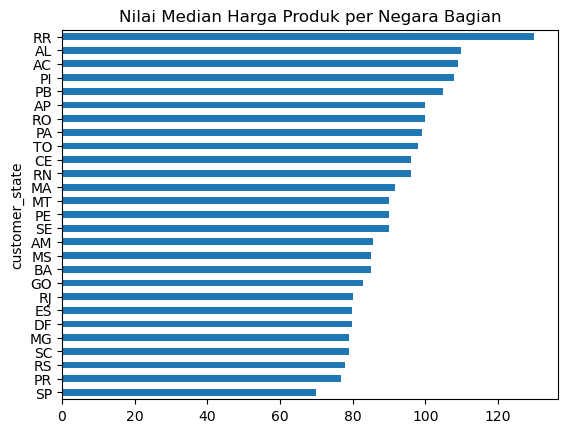

In [15]:
df.groupby('customer_state').median()['price'].sort_values(ascending=True).plot.barh()
plt.title('Nilai Median Harga Produk per Negara Bagian')
plt.show()

Dari grafik diatas terlihat negara bagian RR (Roraima), AL (Alagoas), dan AC (Acre) merupakan 3 negara bagian dengan nilai barang tertinggi dilihat dari median harga barangnya.

Namun customer tentu akan mencari biaya yang paling kecil dalam hal ini adalah harga yang paling murah, sehingga SP (Sao Paulo) merupakan negara dengan harga paling murah diikuti oleh PR (Parana), dan RS (Rio Grande do Sul).

C:\Users\Fazas\AppData\Local\Temp\ipykernel_14296\4215363603.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



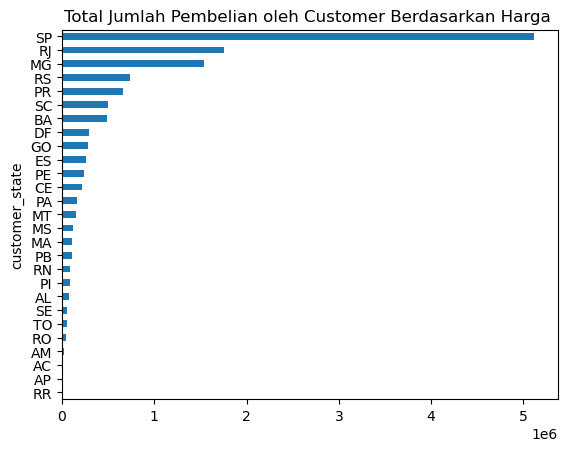

In [16]:
df.groupby('customer_state').sum()['price'].sort_values(ascending=True).plot.barh()
plt.title('Total Jumlah Pembelian oleh Customer Berdasarkan Harga ')

plt.show()

Dari grafik di atas terlihat bahwa negara bagian SP (Sao Paulo) memiliki jumlah pembelian paling tinggi dilihat dari total harganya dibandingkan negara bagian lain, diikuti oleh RJ (Rio de Janeiro) diurutan kedua, dan MG (Minas Gerais) diurutan ketiga. 

hal ini juga sejalan dengan grafik jumlah customer terbanyak diatas.

C:\Users\Fazas\AppData\Local\Temp\ipykernel_14296\2150067159.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



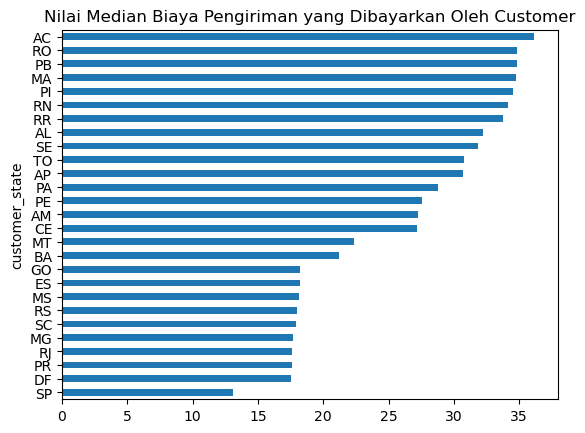

In [17]:
df.groupby('customer_state').median()['freight_value'].sort_values(ascending=True).plot.barh()
plt.title('Nilai Median Biaya Pengiriman yang Dibayarkan Oleh Customer')

plt.show()

Dari grafik di atas terlihat bahwa negara bagian AC (Acre) memiliki jumlah biaya pengiriman paling tinggi dibandingkan negara bagian lain, diikuti oleh RO (Rondonia) diurutan kedua, dan PB (Paraiba) diurutan ketiga. 

Namun sama seperti tabel harga diatas, customer tentu akan mencari biaya yang paling kecil dalam hal ini adalah biaya pengiriman yang paling kecil, sehingga SP (Sao Paulo) merupakan negara dengan biaya pengiriman paling kecil diikuti oleh DF (Distrito Federal), dan PR (Parana).

C:\Users\Fazas\AppData\Local\Temp\ipykernel_26156\4289821985.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



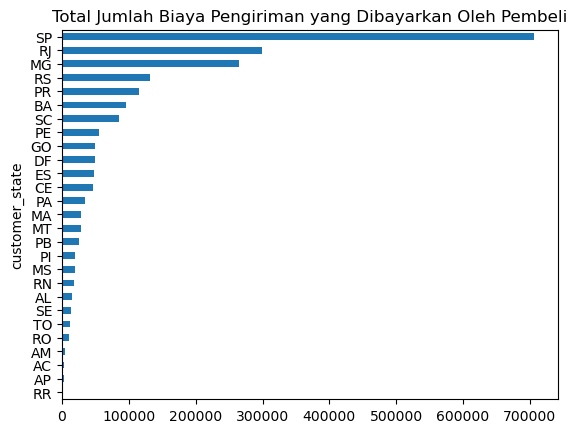

In [81]:
df.groupby('customer_state').sum()['freight_value'].sort_values(ascending=True).plot.barh()
plt.title('Total Jumlah Biaya Pengiriman yang Dibayarkan Oleh Pembeli')

plt.show()

Dari grafik di atas terlihat bahwa negara bagian SP (Sao Paulo) memiliki jumlah biaya pengiriman paling tinggi dibandingkan negara bagian lain, diikuti oleh RJ (Rio de Janeiro) diurutan kedua, dan MG (Minas Gerais) diurutan ketiga. 

hal ini juga sejalan dengan grafik jumlah customer terbanyak dan jumlah pembelian terbanyak diatas.

### Payment Value

In [82]:
df['payment_value'].describe()

count    108287.000000
mean        174.449950
std         267.264225
min           0.000000
25%          63.420000
50%         111.220000
75%         191.760000
max       13664.080000
Name: payment_value, dtype: float64

In [83]:
def boundaries(data, variables):
    Q1 = data[variables].quantile(.25)
    Q3 = data[variables].quantile(.75)
    IQR = Q3-Q1
    lower = Q1 - (1.5*IQR)
    ext_lower = Q1 - (3*IQR)
    upper = Q3 + (1.5*IQR)
    ext_upper = Q3 + (3*IQR)
    return Q1, Q3, IQR, lower, ext_lower, upper, ext_upper

In [84]:
Q1, Q3, IQR, lower, ext_lower, upper, ext_upper = boundaries(df, 'payment_value')
print('Q1 : ', Q1)
print('Q3 : ', Q3)
print('IQR : ', IQR)
print('Upper boundaries:', upper)
print('Extreme upper boundaries:', ext_upper)
print('Lower boundaries:', lower)
print('Extreme lower boundaries:', ext_lower)

Q1 :  63.42
Q3 :  191.76
IQR :  128.33999999999997
Upper boundaries: 384.27
Extreme upper boundaries: 576.78
Lower boundaries: -129.08999999999997
Extreme lower boundaries: -321.5999999999999


In [85]:
# Check Outlier
fig = px.box(df, y="payment_value")
fig.show()

Dari sini terlihat terdapat anomali yaitu banyak data yang memiliki duplikat, serta nilai payment value yang tidak sesuai dimana seharusnya nilai payment value adalah penjumlahan dari price dan freight value.

In [86]:
# Check Anomali Data
df[df['payment_value'] > 5000][['customer_unique_id', 'order_id', 'order_approved_at', 'price', 'freight_value', 'payment_value']]

,customer_unique_id,order_id,order_approved_at,price,freight_value,payment_value
33813,dc4802a71eae9be1dd28f5d788ceb526,0812eb902a67711a1cb742b3cdaa65ae,2017-02-12 20:45:12,6735.0,194.31,6929.31
92084,ff4159b92c40ebe40454e3e6a7c35ed6,f5136e38d1a14a4dbd87dff67da82701,2017-05-26 02:45:17,6499.0,227.66,6726.66
98645,0a0a92112bd4c708ca5fde585afaa872,03caa2c082116e1d31e67e9ae3700499,2017-10-02 15:28:20,1680.0,28.01,13664.08
98646,0a0a92112bd4c708ca5fde585afaa872,03caa2c082116e1d31e67e9ae3700499,2017-10-02 15:28:20,1680.0,28.01,13664.08
98647,0a0a92112bd4c708ca5fde585afaa872,03caa2c082116e1d31e67e9ae3700499,2017-10-02 15:28:20,1680.0,28.01,13664.08
98648,0a0a92112bd4c708ca5fde585afaa872,03caa2c082116e1d31e67e9ae3700499,2017-10-02 15:28:20,1680.0,28.01,13664.08
98649,0a0a92112bd4c708ca5fde585afaa872,03caa2c082116e1d31e67e9ae3700499,2017-10-02 15:28:20,1680.0,28.01,13664.08
98650,0a0a92112bd4c708ca5fde585afaa872,03caa2c082116e1d31e67e9ae3700499,2017-10-02 15:28:20,1680.0,28.01,13664.08
98651,0a0a92112bd4c708ca5fde585afaa872,03caa2c082116e1d31e67e9ae3700499,2017-10-02 15:28:20,1680.0,28.01,13664.08
98652,0a0a92112bd4c708ca5fde585afaa872,03caa2c082116e1d31e67e9ae3700499,2017-10-02 15:28:20,1680.0,28.01,13664.08


In [87]:
df[df['payment_value'] > 2500][['customer_unique_id', 'order_id', 'order_approved_at', 'price', 'freight_value', 'payment_value', 'Category']]

,customer_unique_id,order_id,order_approved_at,price,freight_value,payment_value,Category
16620,59d66d72939bc9497e19d89c61a96d5f,fb441bffe443e71cb16477c4743591e8,2017-03-02 13:05:58,2600.00,26.07,2626.07,Sports Products
21063,ce3fe361f9e68bf0a813baaae1334d01,94fca82966c05ba707f4e7dc0c50aa3c,2018-08-15 17:15:18,3099.00,252.35,3351.35,Sports Products
22778,bc5e25094a7d51b6aee35236572e64f4,a53e05ecd2ed1f46a2b8e1f5828be7c6,2018-01-27 14:35:51,3690.00,136.80,3826.80,Sports Products
22779,ca27f3dac28fb1063faddd424c9d95fa,b239ca7cd485940b31882363b52e6674,2018-07-30 08:15:14,4059.00,104.51,4163.51,Sports Products
23581,c21e93b1d7b7a416d0f36fa6ebc1d60a,362aa88dd1265e7b4ea491b5836fb5f6,2017-05-17 02:10:12,2799.00,28.00,2827.00,Sports Products
...,...,...,...,...,...,...,...
108293,48e1ac109decbb87765a3eade6854098,8dbc85d1447242f3b127dda390d56e19,2018-06-22 12:36:36,4590.00,91.78,4681.78,Electronics & Gadgets
108296,895617ab63a9ad8881d9470f7427cd25,0af28d87520565eb3b57c9b2abe1a2cc,2017-10-05 20:28:06,2999.99,126.51,3126.50,Electronics & Gadgets
108297,c6111f70f40b3420e387493c627c27fa,d9956b0805e324db3f2a546ef216c10b,2017-10-10 15:06:46,2999.99,126.51,3126.50,Electronics & Gadgets
108298,2c3b08cf3584d8c0a81d9618a73aa219,3a4b013e014723cc38c9faa8ffdc6387,2018-04-10 07:35:20,3399.99,126.47,3526.46,Electronics & Gadgets


In [88]:
# Membuat plot scatter matrix untuk melihat korelasi antar variabel numerik

fig = px.scatter(df, x='price', y='payment_value', color='Category')
fig.update_layout(title='Scatter Plot', width=800, height=500)
fig.show()

Dari sini terlihat terdapat banyak anomali data yang tidak sesuai, dimana seharusnya nilai payment value adalah penjumlahan dari nilai `price` dan juga `freight_value` sehingga kita akan berfokus pada data yang valid saja. 

Keberadaan nilai payment value yang tidak valid dapat dikarenakan terdapat beberapa data yang tidak sesuai, sehingga kedepannya akan kesulitan untuk dilakukan intepretasi data.

Maka dari itu kami akan menggunakan data yang valid yaitu data `payment_value` yang merupakan penjumlahan dari `price` dengan `freight_value`.

In [89]:
df = df[df['payment_value'] == (df['price'] + df['freight_value'])]

In [90]:
fig = px.box(df, y="payment_value")
fig.show()

In [91]:
Q1, Q3, IQR, lower, ext_lower, upper, ext_upper = boundaries(df, 'payment_value')
print('Q1 : ', Q1)
print('Q3 : ', Q3)
print('IQR : ', IQR)
print('Upper boundaries:', upper)
print('Extreme upper boundaries:', ext_upper)
print('Lower boundaries:', lower)
print('Extreme lower boundaries:', ext_lower)

Q1 :  62.54
Q3 :  172.55
IQR :  110.01000000000002
Upper boundaries: 337.56500000000005
Extreme upper boundaries: 502.5800000000001
Lower boundaries: -102.47500000000005
Extreme lower boundaries: -267.49000000000007


In [92]:
len(df[(df['payment_value'] > ext_upper)])

2723

In [93]:
df = df[~(df['payment_value'] > ext_upper)]

Terlihat disini bahwa jika dibandingkan dengan data sebelumnya, nilai outlier yang sangat tinggi sudah hilang, hal ini dikarenakan data tersebut memang merupakan sebuah anomali sehingga perlu di bersihkan.

dan jika dilihat disini nilai payment value diatas Extreme Upper Boundaries (502.58) akan kita hapus, karena nilai tersebut sudah melebihi Extreme Upper Boundaries pada data. Selain itu data dengan nilai payment value diatas Extreme Upper Boundaries (502.58) juga berjumlah sedikit yaitu sebanyak 2.723 data atau 4.49% dari keseluruhan data.

### Order Delivery Time Days

In [94]:
# Convert Datetime
df['order_approved_at'] = pd.to_datetime(df['order_approved_at']).dt.strftime('%Y-%m-%d')
df['order_delivered_customer_date'] = pd.to_datetime(df['order_delivered_customer_date']).dt.strftime('%Y-%m-%d')

In [95]:
df['order_approved_at'] = pd.to_datetime(df['order_approved_at'])
df['order_delivered_customer_date'] = pd.to_datetime(df['order_delivered_customer_date'])

In [96]:
df['delivery_time_days']=df['order_delivered_customer_date']-df['order_approved_at']
df['delivery_time_days'] = df['delivery_time_days'].dt.days
df['delivery_time_days'].head()

0      9
6     12
8     21
18    19
21    23
Name: delivery_time_days, dtype: int64

In [97]:
df['delivery_time_days'].describe()

count    61522.000000
mean        11.943142
std          9.382317
min         -7.000000
25%          6.000000
50%         10.000000
75%         15.000000
max        208.000000
Name: delivery_time_days, dtype: float64

In [98]:
# Check Outlier
fig = px.box(df, y="delivery_time_days")
fig.show()

In [99]:
Q1, Q3, IQR, lower, ext_lower, upper, ext_upper = boundaries(df, 'delivery_time_days')
print('Q1 : ', Q1)
print('Q3 : ', Q3)
print('IQR : ', IQR)
print('Upper boundaries:', upper)
print('Extreme upper boundaries:', ext_upper)
print('Lower boundaries:', lower)
print('Extreme lower boundaries:', ext_lower)

Q1 :  6.0
Q3 :  15.0
IQR :  9.0
Upper boundaries: 28.5
Extreme upper boundaries: 42.0
Lower boundaries: -7.5
Extreme lower boundaries: -21.0


In [100]:
df[((df['delivery_time_days'] < 0) | (df['delivery_time_days'] > ext_upper))]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_sequential,payment_type,payment_installments,payment_value,seller_zip_code_prefix,seller_city,seller_state,subcategory,Category,delivery_time_days
63,bcf130ec4f60035b99625fd5c5fc88ed,eebbe9b9abd6cdfe83e65a48adb338a4,11380,sao vicente,SP,020d1063c6e7cb975472aedbfe0e25ea,delivered,2018-01-05 00:16:05,2018-01-05,2018-02-17 02:08:02,...,1,credit_card,1,157.65,8577,itaquaquecetuba,SP,office_furniture,Furniture,46
99,8706792f42471bcdcea286b14842b5df,50a4d93c1a7e41dbc70d422195ac75b3,15290,buritama,SP,67b5c82e01dc9ea4d82fbd3d51e41bae,delivered,2018-02-05 19:14:46,2018-02-05,2018-02-19 17:38:44,...,1,credit_card,4,227.61,8577,itaquaquecetuba,SP,office_furniture,Furniture,65
158,758f0c7c33755ee08645b2c472640d2e,e5e2698d69db1201c1084f1cdae68239,64027,teresina,PI,e677b67c28dfc75969bbf0ff515c0983,delivered,2018-05-19 12:26:59,2018-05-21,2018-06-07 14:02:00,...,1,credit_card,2,244.78,8577,itaquaquecetuba,SP,office_furniture,Furniture,43
183,8f6ceed676a529b29619a598b377de08,70c5c8376c293342409c02ca6d5e4ff0,95890,teutonia,RS,dfe5f68118c2576143240b8d78e5940a,delivered,2017-03-17 12:32:22,2017-03-17,2017-03-21 18:28:04,...,1,credit_card,6,136.14,8577,itaquaquecetuba,SP,office_furniture,Furniture,186
334,aee6316af49a9075ee0cce8c83a90866,52552f43d5fe8a3a21890062264fa8e9,58050,joao pessoa,PB,ed638b613c111b199c3550cb29fd6bfa,delivered,2018-02-25 12:35:01,2018-02-25,2018-03-06 22:09:18,...,1,credit_card,2,284.43,8577,itaquaquecetuba,SP,office_furniture,Furniture,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107082,e0c162c722b9ee73b89b93199e774b43,d4f535499419d0b8bbdcd7d9a81e5578,78099,cuiaba,MT,f01954cab76ef5d938d291d2f1d201e5,delivered,2017-04-14 18:08:15,2017-04-14,2017-04-20 10:44:35,...,1,credit_card,4,477.13,85603,francisco beltrao,PR,home_appliances_2,Furniture,43
107309,d76831a8621f75ed2c625ebf14d32f4a,a5193126476d6add0588e22815f2fc59,26297,nova iguacu,RJ,912806f58b85a8b3b9a57757227c9a36,delivered,2017-12-20 16:44:00,2017-12-20,2017-12-22 23:05:57,...,1,credit_card,1,258.90,15050,sao jose do rio preto,SP,home_appliances_2,Furniture,43
108442,d55c1ef474adda522c82c7c543753051,67f8c6bfa8bb32bc0248f8385ac48088,22723,rio de janeiro,RJ,4249f543194adf0c9da09119b88a8fb1,delivered,2018-03-06 21:24:13,2018-03-07,2018-03-08 19:01:53,...,1,credit_card,10,133.99,3333,sao paulo,SP,furniture_mattress_and_upholstery,Furniture,43
108468,80e535ac93366a42b2022d744cef5be3,e47c28a8dd1dea1d9ca453433f4a0cbb,89235,joinville,SC,1e12d5b3e0bc11aa9db357373ccde6f8,delivered,2018-02-25 18:09:16,2018-02-25,2018-02-27 18:00:10,...,1,credit_card,10,113.20,20756,rio de janeiro,RJ,furniture_mattress_and_upholstery,Furniture,72


In [101]:
df[((df['delivery_time_days'] < 0) | (df['delivery_time_days'] > upper))]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_sequential,payment_type,payment_installments,payment_value,seller_zip_code_prefix,seller_city,seller_state,subcategory,Category,delivery_time_days
63,bcf130ec4f60035b99625fd5c5fc88ed,eebbe9b9abd6cdfe83e65a48adb338a4,11380,sao vicente,SP,020d1063c6e7cb975472aedbfe0e25ea,delivered,2018-01-05 00:16:05,2018-01-05,2018-02-17 02:08:02,...,1,credit_card,1,157.65,8577,itaquaquecetuba,SP,office_furniture,Furniture,46
95,4c06b42fbf7b97ab10779cda5549cd1c,07d190f123147d9e89d4b922543d7948,65075,sao luis,MA,997fd4b37386d10b57d4ac8cdec011a6,delivered,2018-07-08 09:59:19,2018-07-08,2018-07-25 15:12:00,...,1,credit_card,6,315.75,8577,itaquaquecetuba,SP,office_furniture,Furniture,31
99,8706792f42471bcdcea286b14842b5df,50a4d93c1a7e41dbc70d422195ac75b3,15290,buritama,SP,67b5c82e01dc9ea4d82fbd3d51e41bae,delivered,2018-02-05 19:14:46,2018-02-05,2018-02-19 17:38:44,...,1,credit_card,4,227.61,8577,itaquaquecetuba,SP,office_furniture,Furniture,65
100,dc312943c0d59bc2a318d289cd7beefa,ce7ad2b963f8246d249b10fae033937f,40425,salvador,BA,be454ec4b7cf35a9dfdb8489e9b000b1,delivered,2017-10-26 14:40:31,2017-10-26,2017-11-10 01:48:15,...,1,credit_card,5,258.29,8577,itaquaquecetuba,SP,office_furniture,Furniture,29
125,3d6cec95d1675ccadefbc78fdb9633a4,fc29c90853ee133fe921be3fc4ce9e02,46860,iacu,BA,43fa7a93e747753c3b50ab4a0be0e633,delivered,2018-04-15 18:11:57,2018-04-15,2018-04-24 18:12:24,...,1,credit_card,5,288.82,8577,itaquaquecetuba,SP,office_furniture,Furniture,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108442,d55c1ef474adda522c82c7c543753051,67f8c6bfa8bb32bc0248f8385ac48088,22723,rio de janeiro,RJ,4249f543194adf0c9da09119b88a8fb1,delivered,2018-03-06 21:24:13,2018-03-07,2018-03-08 19:01:53,...,1,credit_card,10,133.99,3333,sao paulo,SP,furniture_mattress_and_upholstery,Furniture,43
108468,80e535ac93366a42b2022d744cef5be3,e47c28a8dd1dea1d9ca453433f4a0cbb,89235,joinville,SC,1e12d5b3e0bc11aa9db357373ccde6f8,delivered,2018-02-25 18:09:16,2018-02-25,2018-02-27 18:00:10,...,1,credit_card,10,113.20,20756,rio de janeiro,RJ,furniture_mattress_and_upholstery,Furniture,72
108475,40dab28c1313cba6be3840cd5205ec79,748676b734193378215287357e4da6ca,59585,sao miguel do gostoso,RN,9edafa4c6dbc4a9dd05637c84bf96605,delivered,2017-11-27 23:57:41,2017-11-28,2017-12-04 22:04:25,...,1,credit_card,2,288.29,73020,brasilia,DF,furniture_mattress_and_upholstery,Furniture,49
108498,05f830d6d4afd135824b04ce45d20f00,d07fdfa2b78ab36b0f339706aa4f5a09,94960,cachoeirinha,RS,9966919513b173e92155677f14ec8a67,delivered,2017-12-05 21:26:28,2017-12-05,2017-12-07 14:32:54,...,1,credit_card,1,38.91,19803,assis,SP,flowers,Furniture,30


Dari sini terlihat beberapa data yang memiliki anomali dan outliers.

Jika diperhatikan terdapat delivery time days yang bernilai -7 dimana hal tersebut tidak mungkin terjadi, sehingga kita tidak akan menggunakan data tersebut.

Dan ketika kita sudah membersihkan anomali yang ada, tetap terdapat outliers pada data. Untuk mengatasi outlier kita dapat melakukan dengan 3 skenario yaitu:

- **Skenario 1**: menghapus outlier yang memiliki data lebih dari 150 karena gap nya cukup besar.

- **Skenario 2**: menghapus outlier yang memiliki data lebih besar dari nilai extreme batas atasnya.

- **Skenario 3**: mengapus outlier yang memiliki data lebih besar dari nilai batas atasnya.


Jika kita menggunakan skenario 1, jumlah outliers hanya sedikit yang terhapus, lalu jika kita menggunakan skenario 2 terdapat 889 dari 64.199 data atau sebesar 1%. Sedangkan jika kita menggunakan skenario 3 terdapat 3.349 dari 64.199 data atau sebesar 5%.

Sehingga dengan demikian kita akan memilih skenario 2 karena data yang terhapus tidak terlalu banyak serta lama pengiriman masih dapat di intepretasikan.

Kemudian kita akan memfokuskan kepada data yang berada pada rentang batas extreme yaitu sebesar 42 hari. Jika dilihat data anomali dan memiliki outliers berjumlah 889 baris, atau hanya berkisar 1% dari total keseluruhan data.

In [102]:
df = df[~((df['delivery_time_days'] < 0) | (df['delivery_time_days'] > ext_upper))]

### Distribution Price and Payment Value

In [103]:
# Membuat plot histogram untuk melihat distribusi variabel numerik
fig = px.histogram(df, x='price', nbins=25, color='Category')
fig.update_layout(title='Price Distribution', width=800, height=400)
fig.show()

In [104]:
fig = px.histogram(df, x='payment_value', nbins=25, color='Category')
fig.update_layout(title='Payment Value Distribution', width=800, height=400)
fig.show()

Jika dilihat dari informasi diatas terlihat bahwa, persebaran data terpusat pada range 0-500 saja, namun dengan demikian kita tidak bisa menyimpulkan bahwa data selain di range tersebut merupakan anomali kita perlu melakukan pemeriksaan kembali apakah harga tersebut masih masuk akal atau tidak.

In [105]:
len(df[df['price'] > 500])

0

In [106]:
df[df['price'] > 500]['Category'].value_counts()

Series([], Name: Category, dtype: int64)

Jika dilihat dari sini mayoritas barang dengan harga diatas pusat data adalah di dominasi oleh kategori electronics lalu diikuti oleh furniture. Jika berdasarkan domain knowledge hal ini masih wajar karena memang untuk harga penjualan kedua kategori tersebut terbilang tidak murah.

Selain itu jika diperhatikan jumlah seluruh data yang berada di luar range pusat data hanya berkisar 2.340 saja sehingga jika dibandingkan dengan keseluruhan data jumlah nya sangat kecil. Dengan demikian kita tetap akan menggunakan data tersebut karena kami anggap tidak terdapat anomali.

## Daily Order Trends

In [107]:
# Convert Data type
df['order_purchase_timestamp'] = pd.to_datetime(df['order_purchase_timestamp'])

#menambahkan order_day agar jumlah order bisa dikelompokan per hari
df['order_day'] = df['order_purchase_timestamp'].dt.day_name()
#menambah order_day_num untuk menunjukkan angka hari setiap pekan. berguna untuk mengurutkan
df['order_day_num'] = df['order_purchase_timestamp'].dt.day_of_week
df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_installments,payment_value,seller_zip_code_prefix,seller_city,seller_state,subcategory,Category,delivery_time_days,order_day,order_day_num
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16,2017-05-23 10:47:57,...,2,146.87,8577,itaquaquecetuba,SP,office_furniture,Furniture,9,Tuesday,1
6,fbd40c083aa8cddebb5265b2ba6aaf2e,f40ab89b622248b7ca125af4b486b887,32341,contagem,MG,e0b26f14d2bcc710bb02f77a4628763b,delivered,2017-05-16 10:00:49,2017-05-17,2017-05-23 10:35:48,...,1,155.70,8577,itaquaquecetuba,SP,office_furniture,Furniture,12,Tuesday,1
8,1c37c0f0cd1d88d46d9fc9494762abbd,432ecfa8b7b7ad2663c7abed0dc83c51,31270,belo horizonte,MG,c4e2bd2043fbd75b325a47adfabf0d77,delivered,2018-03-15 07:45:10,2018-03-15,2018-03-27 15:58:41,...,3,150.07,8577,itaquaquecetuba,SP,office_furniture,Furniture,21,Thursday,3
18,c49bec5f74f0413130abdaed8e7621d0,67d6f91d256bdf128fc960a166f413d5,25640,petropolis,RJ,0d831c5aa932379c1cf5b0b1b40b214b,delivered,2017-10-13 10:36:54,2017-10-13,2017-10-24 18:58:49,...,1,151.17,8577,itaquaquecetuba,SP,office_furniture,Furniture,19,Friday,4
21,f91eb13e253823f25cf9a20fc2d08f56,1c91f8d50340522dd6601237ad13afff,78500,colider,MT,be2463c66944514bb175f7a519a72cd7,delivered,2018-02-07 19:01:48,2018-02-07,2018-02-20 13:59:00,...,1,160.18,8577,itaquaquecetuba,SP,office_furniture,Furniture,23,Wednesday,2


In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 60698 entries, 0 to 108612
Data columns (total 41 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_id                    60698 non-null  object        
 1   customer_unique_id             60698 non-null  object        
 2   customer_zip_code_prefix       60698 non-null  int64         
 3   customer_city                  60698 non-null  object        
 4   customer_state                 60698 non-null  object        
 5   order_id                       60698 non-null  object        
 6   order_status                   60698 non-null  object        
 7   order_purchase_timestamp       60698 non-null  datetime64[ns]
 8   order_approved_at              60698 non-null  datetime64[ns]
 9   order_delivered_carrier_date   60698 non-null  object        
 10  order_delivered_customer_date  60698 non-null  datetime64[ns]
 11  order_estimate

In [109]:
#menghitung jumlah order per hari
daily_total_order = df.groupby(['order_day','order_day_num'])['order_id'].nunique()

#Mengembalikan data ke dalam bentuk data frame kembali
daily_total_order = pd.DataFrame(daily_total_order)
daily_total_order.reset_index(inplace=True)

#membuat nama kolom
daily_total_order.columns = ['order_day','order_day_num','total_order']

#Mengurutkan hari secara ascending (dari kecil ke besar)
daily_total_order.sort_values('order_day_num', ascending=True, inplace=True)
daily_total_order

,order_day,order_day_num,total_order
1,Monday,0,9893
5,Tuesday,1,9656
6,Wednesday,2,9434
4,Thursday,3,8929
0,Friday,4,8483
2,Saturday,5,6619
3,Sunday,6,7331


In [110]:
#membuat grafik
fig = go.Figure()
fig.add_trace(go.Bar(x=daily_total_order['order_day'], y=daily_total_order['total_order']))

fig.update_layout(title='Daily Order Number',
                  xaxis_title='Day',
                  yaxis_title='Total Order')

fig.show()

Dari informasi diatas didapatkan bahwa:
1. Jumlah order pada hari weekday lebih banyak dibandingkan di weekend
2. Hari Senin, Selasa, Rabu merupakan 3 hari yang paling banyak pesanan
3. Terdapat trend penurunan order dari senin hingga sabtu

## Payment Types

In [111]:
fig = px.pie(df, names='payment_type', title='Proportion of Payment Types')
fig.show()

Dari informasi diatas terlihat bahwa metode pembayaran didominasi dengan penggunaan credit_card dimana sebanyak 76.6% transaksi pembayaran menggunakannya, lalu metode pembayaran yang banyak digunakan adalah metode pembayaran boleto sebanyak 20.5%.

Boleto (dalam bahasa indonesia berarti tiket) adalah metode pembayaran tunai yang paling populer di brasil. Boleto sendiri berbentuk voucher cetak atau virtual dengan kode batang, detail pembayaran, dan informasi pelanggan yang dimana pelanggan dapat membayarkannya di berbagai merchant seperti bank, ATM, dan toserba.

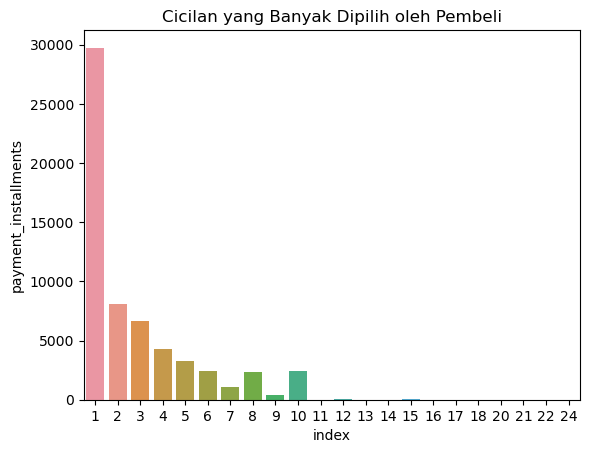

In [112]:
x = df['payment_installments'].value_counts().reset_index().sort_values('index', ascending=True)
sns.barplot(data=x, x='index', y='payment_installments')
plt.title('Cicilan yang Banyak Dipilih oleh Pembeli')

plt.show()

Dari informasi diatas terlihat bahwa metode pembayaran yang menggunakan credit_card banyak yang mengambil cicilan jangka pendek yaitu antara satu sampai lima bulan dimana cicilan terbanyak adalah satu bulan.

## Retention Rate with Cohort Analysis

Retention rate adalah metrik yang digunakan untuk mengukur persentase pelanggan atau pengguna suatu produk atau layanan yang memutuskan untuk tetap menggunakan produk atau layanan tersebut dalam periode waktu tertentu. 

In [113]:
data = df[['customer_unique_id' ,'order_approved_at']].copy()

In [114]:
data.rename(columns={'customer_unique_id': 'CustomerID', 'order_approved_at': 'InvoiceDate'}, inplace=True)

In [115]:
data["InvoiceDate"] = pd.to_datetime(data["InvoiceDate"])

In [116]:
data['cohort_month'] = data.groupby('CustomerID')['InvoiceDate'].transform('min').dt.to_period('M')

In [117]:
data['current_month'] = data['InvoiceDate'].dt.to_period('M')

In [118]:
data.head()

,CustomerID,InvoiceDate,cohort_month,current_month
0,861eff4711a542e4b93843c6dd7febb0,2017-05-16,2017-05,2017-05
6,f40ab89b622248b7ca125af4b486b887,2017-05-17,2017-05,2017-05
8,432ecfa8b7b7ad2663c7abed0dc83c51,2018-03-15,2018-03,2018-03
18,67d6f91d256bdf128fc960a166f413d5,2017-10-13,2017-10,2017-10
21,1c91f8d50340522dd6601237ad13afff,2018-02-07,2018-02,2018-02


In [119]:
# total distinct number 
df_cohort = data.groupby(['cohort_month', 'current_month'], as_index=False)['CustomerID'].nunique().rename(columns={'CustomerID': 'n_customer'})
df_cohort.head()

,cohort_month,current_month,n_customer
0,2017-01,2017-01,436
1,2017-01,2017-02,3
2,2017-01,2017-03,1
3,2017-01,2017-05,1
4,2017-01,2017-06,1


In [120]:
# Period: selisih antara current month dengan cohort month
df_cohort['period']=(df_cohort['current_month']-df_cohort['cohort_month']).apply(attrgetter('n'))
# attrgetter untuk mengambil angka hasil pengurangan tanggal tanpa atribut monthend
df_cohort

,cohort_month,current_month,n_customer,period
0,2017-01,2017-01,436,0
1,2017-01,2017-02,3,1
2,2017-01,2017-03,1,2
3,2017-01,2017-05,1,4
4,2017-01,2017-06,1,5
...,...,...,...,...
189,2018-06,2018-07,10,1
190,2018-06,2018-08,3,2
191,2018-07,2018-07,3865,0
192,2018-07,2018-08,10,1


In [121]:
pivot_cohort = df_cohort.pivot_table(index='cohort_month', columns='period', values='n_customer')
pivot_cohort

period,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
cohort_month,,,,,,,,,,,,,,,,,,
2017-01,436.0,3.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN,NaN,2.0,1.0,2.0,1.0,NaN,NaN,NaN,3.0
2017-02,954.0,2.0,1.0,2.0,5.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,NaN,2.0,1.0,NaN,1.0
2017-03,1476.0,6.0,4.0,3.0,4.0,1.0,2.0,5.0,3.0,1.0,3.0,NaN,3.0,2.0,1.0,1.0,1.0,2.0
2017-04,1336.0,7.0,4.0,1.0,1.0,2.0,3.0,2.0,5.0,4.0,4.0,NaN,1.0,1.0,1.0,NaN,NaN,NaN
2017-05,2136.0,10.0,6.0,2.0,4.0,5.0,5.0,5.0,4.0,4.0,2.0,4.0,3.0,2.0,1.0,3.0,NaN,NaN
2017-06,1911.0,7.0,5.0,8.0,5.0,4.0,4.0,5.0,2.0,1.0,4.0,6.0,1.0,2.0,3.0,NaN,NaN,NaN
2017-07,2411.0,11.0,3.0,4.0,3.0,2.0,6.0,1.0,4.0,3.0,4.0,3.0,3.0,5.0,NaN,NaN,NaN,NaN
2017-08,2683.0,14.0,7.0,2.0,10.0,15.0,4.0,5.0,3.0,3.0,3.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
2017-09,2527.0,16.0,11.0,6.0,4.0,4.0,3.0,4.0,7.0,4.0,6.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN


In [122]:
pivot_cohort = pivot_cohort.divide(pivot_cohort[0], axis=0)

In [123]:
pivot_cohort

period,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
cohort_month,,,,,,,,,,,,,,,,,,
2017-01,1.0,0.006881,0.002294,NaN,0.002294,0.002294,0.002294,NaN,NaN,NaN,0.004587,0.002294,0.004587,0.002294,NaN,NaN,NaN,0.006881
2017-02,1.0,0.002096,0.001048,0.002096,0.005241,0.001048,0.002096,0.002096,0.001048,0.002096,0.002096,0.002096,0.002096,NaN,0.002096,0.001048,NaN,0.001048
2017-03,1.0,0.004065,0.002710,0.002033,0.002710,0.000678,0.001355,0.003388,0.002033,0.000678,0.002033,NaN,0.002033,0.001355,0.000678,0.000678,0.000678,0.001355
2017-04,1.0,0.005240,0.002994,0.000749,0.000749,0.001497,0.002246,0.001497,0.003743,0.002994,0.002994,NaN,0.000749,0.000749,0.000749,NaN,NaN,NaN
2017-05,1.0,0.004682,0.002809,0.000936,0.001873,0.002341,0.002341,0.002341,0.001873,0.001873,0.000936,0.001873,0.001404,0.000936,0.000468,0.001404,NaN,NaN
2017-06,1.0,0.003663,0.002616,0.004186,0.002616,0.002093,0.002093,0.002616,0.001047,0.000523,0.002093,0.003140,0.000523,0.001047,0.001570,NaN,NaN,NaN
2017-07,1.0,0.004562,0.001244,0.001659,0.001244,0.000830,0.002489,0.000415,0.001659,0.001244,0.001659,0.001244,0.001244,0.002074,NaN,NaN,NaN,NaN
2017-08,1.0,0.005218,0.002609,0.000745,0.003727,0.005591,0.001491,0.001864,0.001118,0.001118,0.001118,0.000373,0.000373,NaN,NaN,NaN,NaN,NaN
2017-09,1.0,0.006332,0.004353,0.002374,0.001583,0.001583,0.001187,0.001583,0.002770,0.001583,0.002374,0.000396,NaN,NaN,NaN,NaN,NaN,NaN


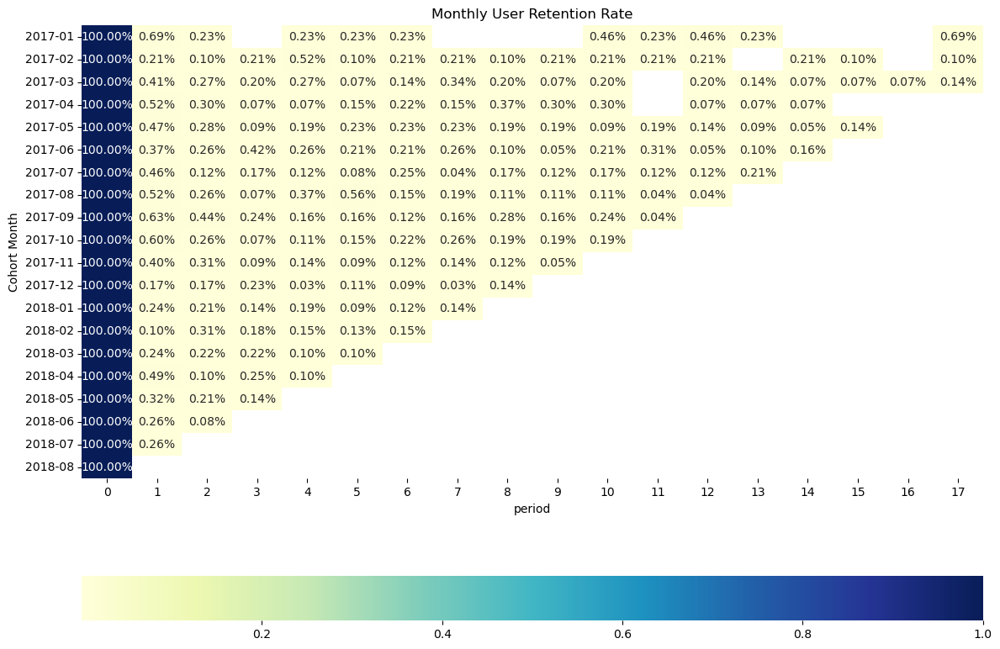

In [124]:
plt.figure(figsize=(12,8))
sns.heatmap(pivot_cohort,
            annot=True,
            fmt='.2%',
            cmap='YlGnBu',
            cbar_kws={'orientation':'horizontal'})
plt.tight_layout()
plt.xlabel('period')
plt.ylabel('Cohort Month')
plt.title('Monthly User Retention Rate')
plt.show()

Retention rate adalah persentase pelanggan yang kembali melakukan pembelian setelah pembelian pertama mereka. Tabel tersebut menunjukkan tingkat retensi pelanggan selama periode waktu tertentu, dibagi berdasarkan bulan cohort dan jumlah periode setelah pembelian pertama.

Diatas merupakan plot dari Cohort Analysis untuk Retention Rate, dari sini terlihat bahwa seiring periode tingkat retensi dari customer cukup turun secara signifikan bahkan tidak ada yang mencapai 1% retention rate, hal ini menjadi sebuah permasalahan bagi bisnis dalam mempertahankan customer.

In [125]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 60698 entries, 0 to 108612
Data columns (total 41 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_id                    60698 non-null  object        
 1   customer_unique_id             60698 non-null  object        
 2   customer_zip_code_prefix       60698 non-null  int64         
 3   customer_city                  60698 non-null  object        
 4   customer_state                 60698 non-null  object        
 5   order_id                       60698 non-null  object        
 6   order_status                   60698 non-null  object        
 7   order_purchase_timestamp       60698 non-null  datetime64[ns]
 8   order_approved_at              60698 non-null  datetime64[ns]
 9   order_delivered_carrier_date   60698 non-null  object        
 10  order_delivered_customer_date  60698 non-null  datetime64[ns]
 11  order_estimate

In [126]:
df.to_csv('2. EDA.csv', index=False)

## **Untuk EDA yang lebih informatif bisa di cek di link berikut:**  
https://lookerstudio.google.com/reporting/e19a8dff-8f8f-4cf3-bb56-c8f1e8437fad 

**Lanjut Ke Part Selanjutnya: 3. Feature Engineering**